# Importing Libraries


In [1]:
import matplotlib.pyplot as plt
import numpy as np
import time
import pandas as pd
import os

c:\Users\tooch\vsproject\Code\.deepfake\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
c:\Users\tooch\vsproject\Code\.deepfake\lib\site-packages\numpy\.libs\libopenblas.EL2C6PLE4ZYW3ECEVIV3OXXGRN2NRFM2.gfortran-win_amd64.dll
c:\Users\tooch\vsproject\Code\.deepfake\lib\site-packages\numpy\.libs\libopenblas.WCDJNK7YVMPZQ2ME2ZZHJJRJ3JIKNDB7.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


In [2]:
#wd
%cd C:\Users\tooch\vsproject\Code\data

C:\Users\tooch\vsproject\Code\data



# Read the data (`.npy` file)

In [3]:
data = np.load("deepfake_data.npy", allow_pickle=True)

## Check the length of $X$ and $y$

In [4]:
X = []
y = []
for i in data:
  X.append(i[0])
  y.append(i[1])
print(len(X))
print(len(y))
print("The length should be " + str((6985+6999)))

13984
13984
The length should be 13984


In [5]:
print(X)
print(y)
print("data dimension:",data.shape)

[array([[[228, 228, 236],
        [228, 228, 236],
        [228, 228, 236],
        ...,
        [169, 168, 173],
        [166, 165, 170],
        [164, 163, 168]],

       [[229, 229, 237],
        [229, 229, 237],
        [229, 229, 237],
        ...,
        [165, 164, 169],
        [162, 161, 166],
        [160, 159, 164]],

       [[231, 231, 239],
        [231, 231, 239],
        [231, 231, 239],
        ...,
        [157, 156, 161],
        [154, 153, 158],
        [153, 152, 157]],

       ...,

       [[245, 246, 248],
        [245, 246, 248],
        [245, 246, 248],
        ...,
        [228, 236, 249],
        [228, 235, 251],
        [228, 235, 251]],

       [[244, 245, 247],
        [244, 245, 247],
        [244, 245, 247],
        ...,
        [229, 235, 251],
        [230, 236, 252],
        [229, 235, 251]],

       [[244, 245, 247],
        [244, 245, 247],
        [243, 244, 246],
        ...,
        [230, 236, 252],
        [230, 236, 252],
        [229, 235, 251]

## Visualization

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2 entries, 0 to 1
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_type  2 non-null      object
 1   count       2 non-null      int64 
dtypes: int64(1), object(1)
memory usage: 160.0+ bytes


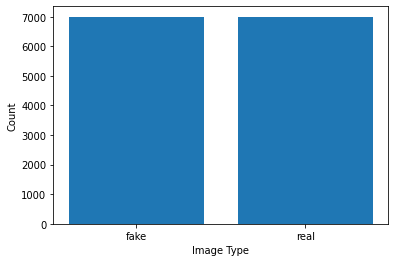

In [6]:
fake_cnt = 0
real_cnt = 0
for i in data:
  if i[1] == 0:
    fake_cnt += 1
  else:
    real_cnt += 1

#print(fake_cnt)
#print(real_cnt)
df = [['fake', fake_cnt], ['real', real_cnt]]
df = pd.DataFrame(df, columns=['image_type', 'count'])
#ax = df.plot.bar(x='video_type', y='count', rot=0)
#fig = plt.figure()
plt.bar(df['image_type'], df['count'])
plt.xlabel("Image Type")
plt.ylabel("Count")
plt.savefig('count_type.png')

df.info()

# Machine Learning Task


In [7]:
# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow.keras import backend as K
from sklearn.model_selection import train_test_split
from efficientnet.tfkeras import EfficientNetB6 #EfficientNetB1, EfficientNetB2, EfficientNetB3, EfficientNetB4, EfficientNetB5, EfficientNetB6, EfficientNetB7
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import load_model
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split


In [8]:
print('TensorFlow version: ', tf.__version__)

TensorFlow version:  2.6.2


# Converting data to three dimensional array

In [9]:
X = np.array(X)
y = np.array(y)

# Splitting data into Training and Testing set

In [10]:
X_train, x_test, Y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42) # 80% for training, 20 for of testing

# Train CNN classifier

In [11]:
efficient_net = EfficientNetB6(
    weights = 'imagenet',
    input_shape = (320,320,3),
    include_top = False,
    pooling = 'max'
)

165535744/165527152 [==============================] - 78s 0us/step


# Model Architecture

In [12]:
model = Sequential()
model.add(efficient_net)
model.add(Dense(units = 512, activation = 'relu'))
model.add(Dropout(0.5))
model.add(Dense(units = 128, activation = 'relu'))
model.add(Dropout(0.5))
model.add(Dense(units = 1, activation = 'sigmoid'))
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnet-b6 (Functional) (None, 2304)              40960136  
_________________________________________________________________
dense (Dense)                (None, 512)               1180160   
_________________________________________________________________
dropout (Dropout)            (None, 512)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 128)               65664     
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 129       
Total params: 42,206,089
Trainable params: 41,981,657
Non-trainable params: 224,432
______________________________________

# Compile model

In [13]:
model.compile(optimizer = Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Creating model directory

In [14]:
checkpoint_filepath = '.\\Model'
print('Creating Directory: ' + checkpoint_filepath)
os.makedirs(checkpoint_filepath, exist_ok=True)

Creating Directory: .\Model


In [15]:
custom_callbacks = [
    EarlyStopping(
        monitor = 'val_loss',
        mode = 'min',
        patience = 5,
        verbose = 1
    ),
    ModelCheckpoint(
        filepath = os.path.join(checkpoint_filepath, 'model.h5'),
        monitor = 'val_loss',
        mode = 'min',
        verbose = 1,
        save_best_only = True
    )
]



# Training model

In [ ]:
start_time = time.time()

num_epochs = 3

history = model.fit(
    X_train[0:3000], Y_train[0:3000],
    epochs = num_epochs,
    steps_per_epoch = len(X_train[0:6000]),
    validation_data = (x_test, y_test),
    validation_steps = len(x_test),
    callbacks = custom_callbacks
)

print(history.history)

print("--- %s seconds ---" % (time.time() - start_time))

Epoch 1/3
6000/6000 [==============================] - 1597s 261ms/step - loss: 0.7856 - accuracy: 0.5815 - val_loss: 0.5012 - val_accuracy: 0.7614

Epoch 00001: val_loss improved from inf to 0.50124, saving model to .\FaceSwap_model\model.h5


d:\toochi\Video_Classifier\code\.classifier\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/3
6000/6000 [==============================] - 906s 151ms/step - loss: 0.2942 - accuracy: 0.8953 - val_loss: 0.2749 - val_accuracy: 0.9082

Epoch 00002: val_loss improved from 0.50124 to 0.27494, saving model to .\FaceSwap_model\model.h5
{'loss': [0.785637378692627, 0.2941702604293823], 'accuracy': [0.5814999938011169, 0.8953333497047424], 'val_loss': [0.5012404322624207, 0.27494195103645325], 'val_accuracy': [0.7614285945892334, 0.908214271068573]}
--- 2527.6247177124023 seconds ---


# Load the saved model that is considered the best

In [ ]:
import pickle
f = open('Neural.pckl', 'wb')
pickle.dump(history.history, f)
f.close()

# # retrieve:    
# f = open('history.pckl', 'rb')
# history = pickle.load(f)
# f.close()

In [16]:
 # loading model
# checkpoint_filepath = 'D:\\toochi\\Video_Classifier\\code\\data\\Model'

best_model = load_model(os.path.join(checkpoint_filepath, 'model.h5'))

# Image prediction

In [17]:
preds = best_model.predict(x_test)

# Saving predicted and output image to a .txt file

In [19]:
test_result = [preds]

with open('deepfake.txt', 'wb') as f:
    np.savetxt(f, np.column_stack(test_result), fmt='%s')

In [20]:
data = [y_test]

with open('deepfake_output.txt', 'wb') as f:
    np.savetxt(f, np.column_stack(data), fmt='%s')

# Confusion Matrix - Accuracy score

In [21]:
def get_classification_metric(testy, probs):
    from sklearn.metrics import precision_recall_curve
    precision, recall, thresholds = precision_recall_curve(testy, probs)
    # convert to f score
    fscore = 2 * (precision * recall) / (precision + recall)
    # locate the index of the largest f score
    ix = np.argmax(fscore)
    return fscore[ix]

In [44]:
from sklearn import metrics
print("F1-Score: ", get_classification_metric(y_test, preds))
print("Accuracy: ", metrics.accuracy_score(y_test, preds.round(), normalize=True, sample_weight=None))
print("Precision: ", metrics.precision_score(y_test, preds.round()))
print("Recall:   ", metrics.recall_score(y_test, preds.round()))
print("Performance of the model on the data \n\n ", metrics.classification_report(y_test, preds.round()))



F1-Score:  0.9293948126801151
Accuracy:  0.898105112620665
Precision:  0.978204010462075
Recall:    0.8118668596237337
Performance of the model on the data 

                precision    recall  f1-score   support

           0       0.84      0.98      0.91      1415
           1       0.98      0.81      0.89      1382

    accuracy                           0.90      2797
   macro avg       0.91      0.90      0.90      2797
weighted avg       0.91      0.90      0.90      2797



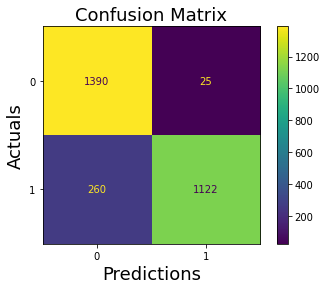

<Figure size 432x288 with 0 Axes>

In [32]:

# IC = type('IdentityClassifier', (), {
#           "predict": lambda i: i, "_estimator_type": "classifier"})
print(ConfusionMatrixDisplay.from_predictions(y_test, preds.round(), normalize=None))

plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()
plt.savefig('Confusion_Mat.png')

